In [1]:
# importing library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
# get the features from the file features.txt
features = list()
with open('features.txt') as  f:
    features = [line.split()[1] for line in f.readlines()]
print('No of featues: {}'.format(len(features)))

No of featues: 561


In [96]:
features

['tBodyAcc-mean()-X',
 'tBodyAcc-mean()-Y',
 'tBodyAcc-mean()-Z',
 'tBodyAcc-std()-X',
 'tBodyAcc-std()-Y',
 'tBodyAcc-std()-Z',
 'tBodyAcc-mad()-X',
 'tBodyAcc-mad()-Y',
 'tBodyAcc-mad()-Z',
 'tBodyAcc-max()-X',
 'tBodyAcc-max()-Y',
 'tBodyAcc-max()-Z',
 'tBodyAcc-min()-X',
 'tBodyAcc-min()-Y',
 'tBodyAcc-min()-Z',
 'tBodyAcc-sma()',
 'tBodyAcc-energy()-X',
 'tBodyAcc-energy()-Y',
 'tBodyAcc-energy()-Z',
 'tBodyAcc-iqr()-X',
 'tBodyAcc-iqr()-Y',
 'tBodyAcc-iqr()-Z',
 'tBodyAcc-entropy()-X',
 'tBodyAcc-entropy()-Y',
 'tBodyAcc-entropy()-Z',
 'tBodyAcc-arCoeff()-X,1',
 'tBodyAcc-arCoeff()-X,2',
 'tBodyAcc-arCoeff()-X,3',
 'tBodyAcc-arCoeff()-X,4',
 'tBodyAcc-arCoeff()-Y,1',
 'tBodyAcc-arCoeff()-Y,2',
 'tBodyAcc-arCoeff()-Y,3',
 'tBodyAcc-arCoeff()-Y,4',
 'tBodyAcc-arCoeff()-Z,1',
 'tBodyAcc-arCoeff()-Z,2',
 'tBodyAcc-arCoeff()-Z,3',
 'tBodyAcc-arCoeff()-Z,4',
 'tBodyAcc-correlation()-X,Y',
 'tBodyAcc-correlation()-X,Z',
 'tBodyAcc-correlation()-Y,Z',
 'tGravityAcc-mean()-X',
 'tGravityA

# getting the train data

In [3]:
#get the data from txt file to pandas dataframe
x_train = pd.read_csv('X_train.txt' , delim_whitespace=True,header= None )
x_train.shape
x_train.columns=[features]
x_train.columns

MultiIndex([(                   'tBodyAcc-mean()-X',),
            (                   'tBodyAcc-mean()-Y',),
            (                   'tBodyAcc-mean()-Z',),
            (                    'tBodyAcc-std()-X',),
            (                    'tBodyAcc-std()-Y',),
            (                    'tBodyAcc-std()-Z',),
            (                    'tBodyAcc-mad()-X',),
            (                    'tBodyAcc-mad()-Y',),
            (                    'tBodyAcc-mad()-Z',),
            (                    'tBodyAcc-max()-X',),
            ...
            (     'fBodyBodyGyroJerkMag-meanFreq()',),
            (     'fBodyBodyGyroJerkMag-skewness()',),
            (     'fBodyBodyGyroJerkMag-kurtosis()',),
            (         'angle(tBodyAccMean,gravity)',),
            ('angle(tBodyAccJerkMean),gravityMean)',),
            (    'angle(tBodyGyroMean,gravityMean)',),
            ('angle(tBodyGyroJerkMean,gravityMean)',),
            (                'angle(X,gravityMean

In [4]:
# add subject column to the dataframe
x_train['subject'] = pd.read_csv('subject_train.txt', header=None , squeeze= True)
x_train['subject'].head(10)

,subject
0,1
1,1
2,1
3,1
4,1
5,1
6,1
7,1
8,1
9,1


In [5]:
y_train = pd.read_csv('y_train.txt', names=['Activity'] , squeeze= True)
y_train_labels = y_train.map({1: 'WALKING' , 2:'WALKING_UPSTAIRS', 3:'WALKING DOWNSTAIRS', \
                             4:'SITTING', 5:'STANDING', 6:'LAYING'})

In [6]:
y_train_labels

0               STANDING
1               STANDING
2               STANDING
3               STANDING
4               STANDING
              ...       
7347    WALKING_UPSTAIRS
7348    WALKING_UPSTAIRS
7349    WALKING_UPSTAIRS
7350    WALKING_UPSTAIRS
7351    WALKING_UPSTAIRS
Name: Activity, Length: 7352, dtype: object

In [7]:
#put all columns in a single dataframe 
train=x_train
train['Activity'] = y_train
train['ActivityName'] = y_train_labels
train.sample(2)

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity,ActivityName
1655,0.282413,-0.012931,-0.115774,-0.992602,-0.975483,-0.966327,-0.992965,-0.973041,-0.964335,-0.930340,...,-0.197218,0.084761,0.599127,-0.609279,-0.660759,-0.096913,-0.119815,8,4,SITTING
2462,0.264169,-0.021259,-0.097137,-0.962358,-0.960321,-0.974914,-0.967030,-0.964960,-0.974632,-0.875889,...,-0.142443,-0.002924,-0.082367,-0.353064,0.283234,-0.255969,-0.687414,14,6,LAYING


# getting the test data

In [8]:
#get the data from txt file to pandas dataframe
x_test = pd.read_csv('X_test.txt' , delim_whitespace=True,header= None )
x_test.shape
x_test.columns=[features]
x_test.columns

MultiIndex([(                   'tBodyAcc-mean()-X',),
            (                   'tBodyAcc-mean()-Y',),
            (                   'tBodyAcc-mean()-Z',),
            (                    'tBodyAcc-std()-X',),
            (                    'tBodyAcc-std()-Y',),
            (                    'tBodyAcc-std()-Z',),
            (                    'tBodyAcc-mad()-X',),
            (                    'tBodyAcc-mad()-Y',),
            (                    'tBodyAcc-mad()-Z',),
            (                    'tBodyAcc-max()-X',),
            ...
            (     'fBodyBodyGyroJerkMag-meanFreq()',),
            (     'fBodyBodyGyroJerkMag-skewness()',),
            (     'fBodyBodyGyroJerkMag-kurtosis()',),
            (         'angle(tBodyAccMean,gravity)',),
            ('angle(tBodyAccJerkMean),gravityMean)',),
            (    'angle(tBodyGyroMean,gravityMean)',),
            ('angle(tBodyGyroJerkMean,gravityMean)',),
            (                'angle(X,gravityMean

In [9]:
# add subject column to the dataframe
x_test['subject'] = pd.read_csv('subject_test.txt', header=None , squeeze= True)
x_test['subject'].head(10)

,subject
0,2
1,2
2,2
3,2
4,2
5,2
6,2
7,2
8,2
9,2


In [10]:
#get the y labels from the txt file
y_test = pd.read_csv('y_test.txt', names=['Activity'] , squeeze= True)
y_test_labels = y_test.map({1: 'WALKING' , 2:'WALKING_UPSTAIRS', 3:'WALKING DOWNSTAIRS', \
                             4:'SITTING', 5:'STANDING', 6:'LAYING'})

In [11]:
#put all columns in a single dataframe 
test=x_test
test['Activity'] = y_test
test['ActivityName'] = y_test_labels
test.sample(10)

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity,ActivityName
155,0.236466,-0.036365,-0.113862,-0.432001,0.068415,0.181346,-0.464748,0.073051,0.113935,-0.215868,...,0.133663,0.399521,-0.837521,0.168613,-0.301118,0.297759,0.460584,2,2,WALKING_UPSTAIRS
2156,0.335578,-0.030491,-0.055030,-0.307769,-0.273427,-0.234928,-0.386983,-0.335067,-0.254816,-0.029990,...,-0.265939,-0.190795,-0.499844,-0.165638,-0.703442,0.240305,0.169813,18,3,WALKING DOWNSTAIRS
1551,0.276119,-0.014135,-0.099039,-0.994151,-0.984809,-0.962891,-0.995081,-0.984919,-0.960187,-0.937788,...,-0.131552,0.069940,-0.035355,0.094969,-0.689663,-0.038737,-0.155545,13,4,SITTING
2060,0.282296,-0.012401,-0.102358,-0.995153,-0.986526,-0.989535,-0.995955,-0.986847,-0.991246,-0.936908,...,0.010051,-0.131303,0.904974,-0.264524,-0.692196,0.245530,0.175528,18,5,STANDING
2213,0.280583,0.000648,-0.113148,-0.994231,-0.876228,-0.973943,-0.995232,-0.889116,-0.974615,-0.936202,...,0.074180,-0.017520,0.728461,0.528425,-0.808907,0.204302,-0.063857,20,5,STANDING
340,0.278050,-0.016253,-0.111578,-0.995874,-0.988293,-0.962748,-0.996197,-0.987231,-0.959297,-0.941440,...,-0.011634,-0.142858,0.101378,0.798606,-0.618966,-0.129607,-0.121260,4,4,SITTING
1098,0.276972,-0.027120,-0.105181,-0.945426,-0.879989,-0.939813,-0.954652,-0.887470,-0.943432,-0.874116,...,-0.072158,-0.083101,-0.510853,0.176592,-0.852431,0.192651,-0.022305,10,4,SITTING
2701,0.213006,-0.001415,-0.118789,-0.025777,-0.058975,-0.168663,-0.063282,-0.190841,-0.244758,0.113974,...,0.632685,-0.188743,-0.758025,-0.380591,-0.834426,0.152466,0.123486,24,3,WALKING DOWNSTAIRS
2165,0.363601,0.002671,0.002048,-0.364091,-0.302654,-0.461859,-0.468513,-0.326293,-0.451232,0.056218,...,-0.081502,0.300597,0.886778,-0.476074,-0.667657,0.248720,0.195942,18,3,WALKING DOWNSTAIRS
39,0.278711,-0.016794,-0.105241,-0.998597,-0.990667,-0.987462,-0.998854,-0.990344,-0.987242,-0.944130,...,-0.224591,0.053342,0.078824,0.286054,-0.813283,0.165297,-0.097450,2,4,SITTING


In [12]:
# Mergeing a data to a singel dataframe
dataset = pd.concat([train , test], axis = 0).reset_index(drop = True)


In [13]:
dataset=dataset.drop(['ActivityName'],axis=1)

In [14]:
# checking missing value 
dataset.isnull().sum().sum()

0

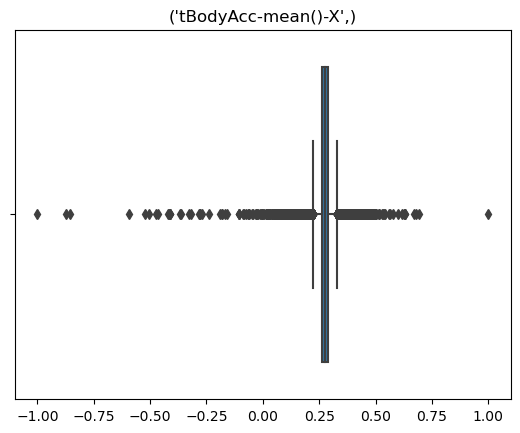

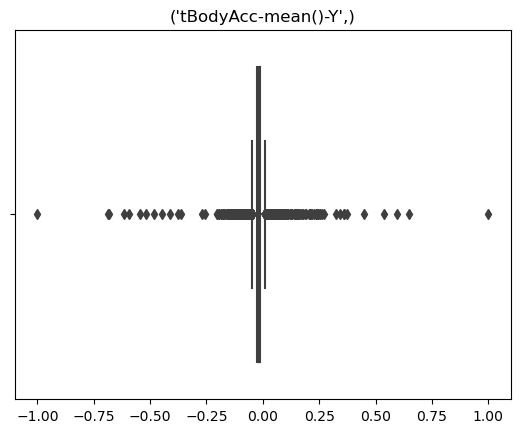

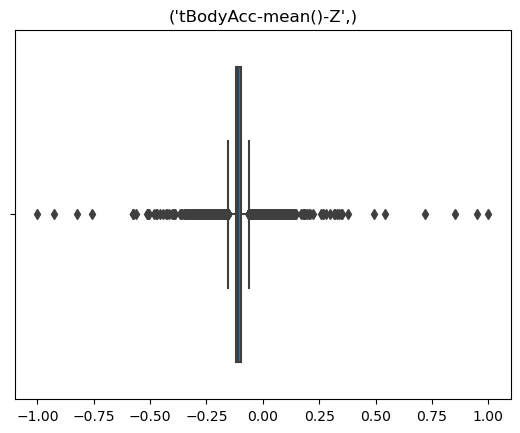

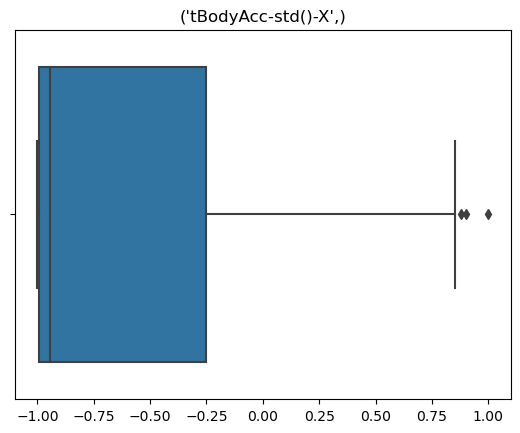

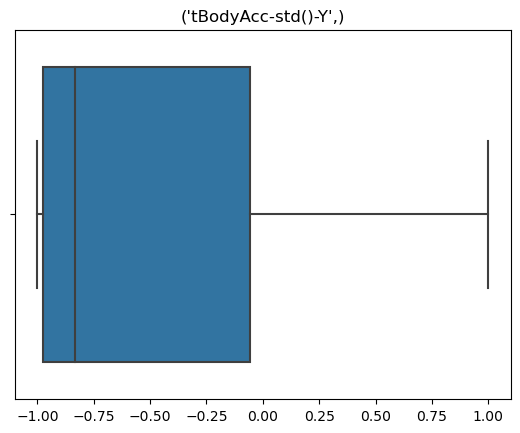

...

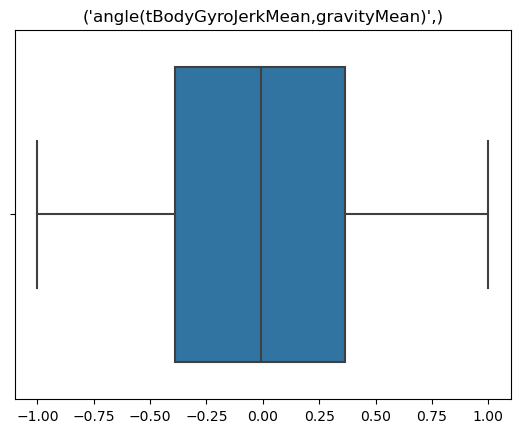

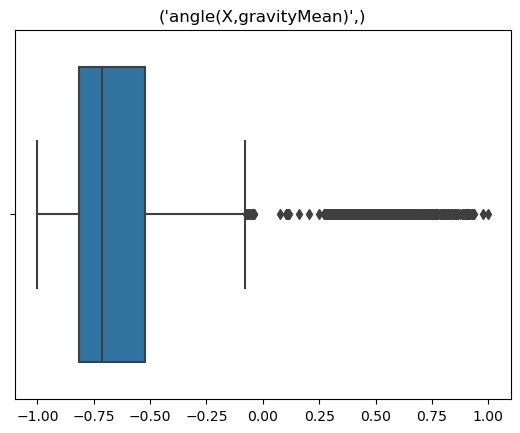

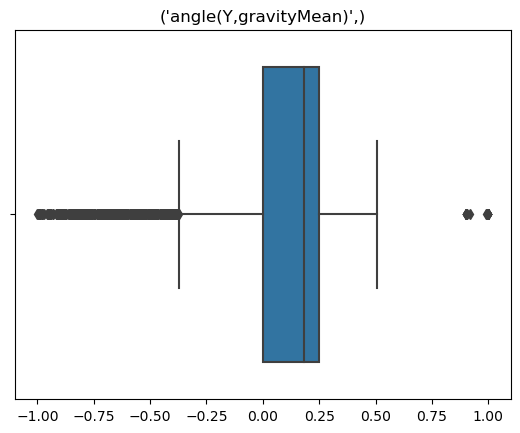

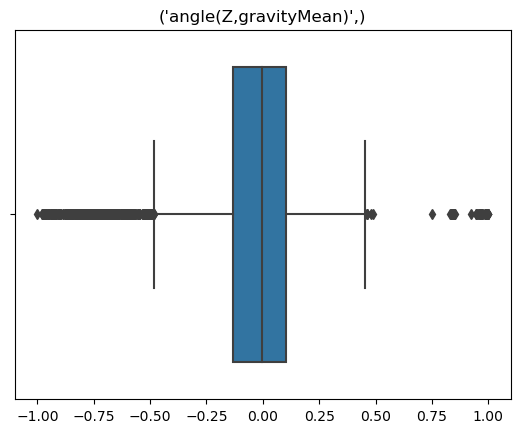

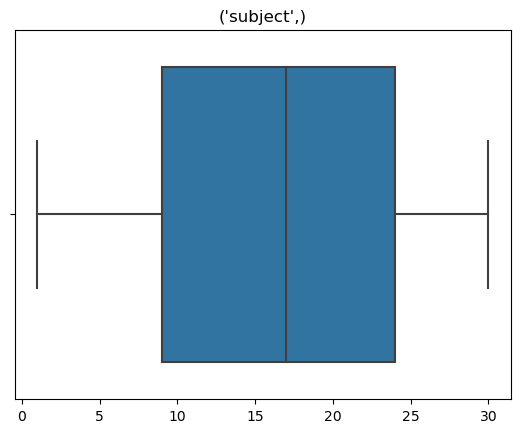

In [15]:
# looking for the outliers

for cols in dataset.columns[:-1]:
    plt.figure()
    sns.boxplot(x=dataset[cols].values)
    plt.title(f'{cols}')
plt.show()

In [16]:
# making a copy of original dataset
data = dataset.copy()
data.shape

(10299, 563)

In [17]:
dataset.shape

(10299, 563)

In [18]:
id(dataset)

3012434210976

In [19]:
id(data)

3012436622160

In [20]:
# removing outliers

for cols in data.columns[:-1]:
    data[cols] = data[cols].clip(lower = data[cols].quantile(0.15), upper = data[cols].quantile(0.85),axis=1)

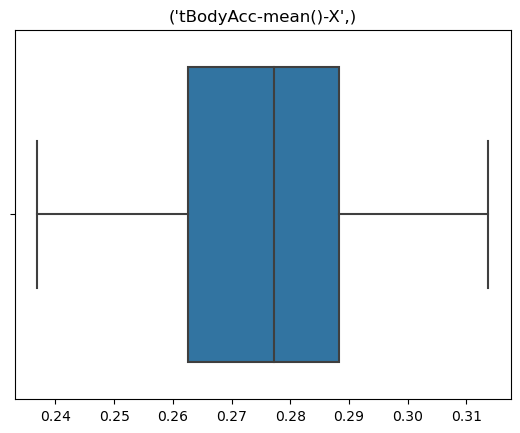

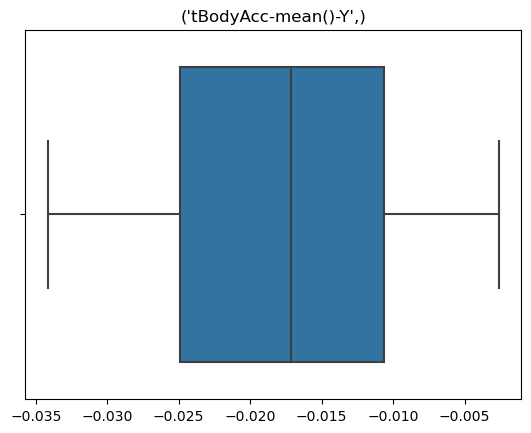

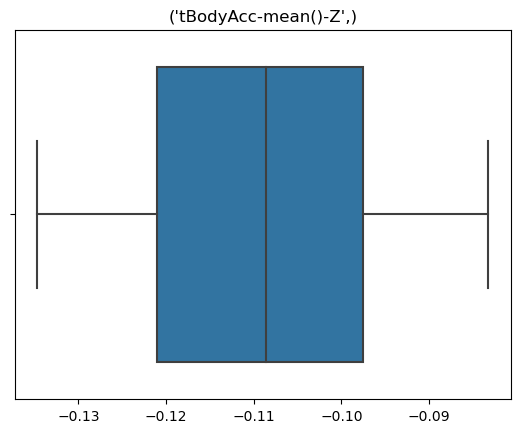

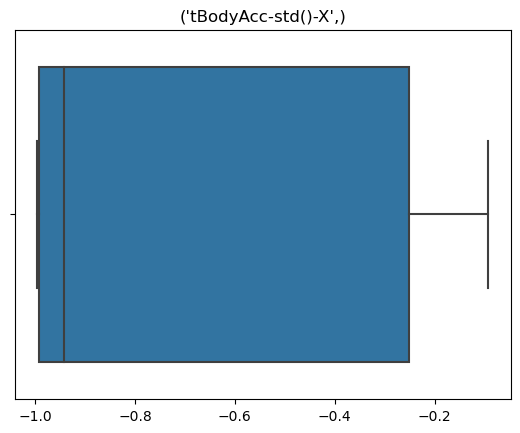

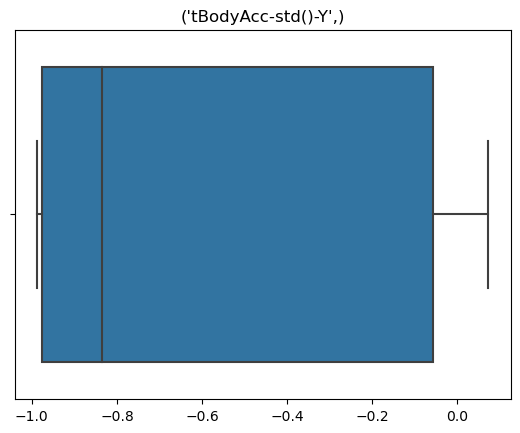

...

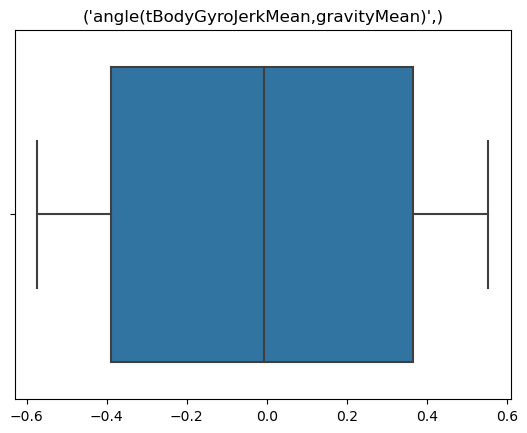

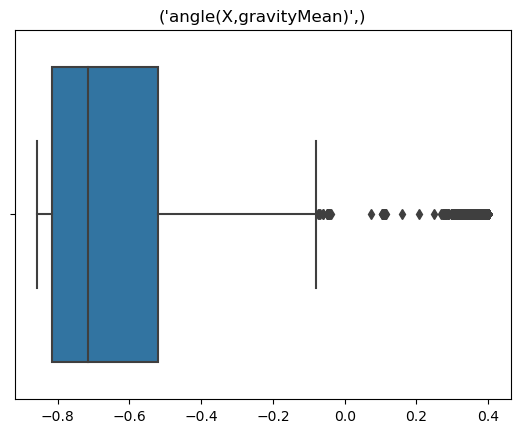

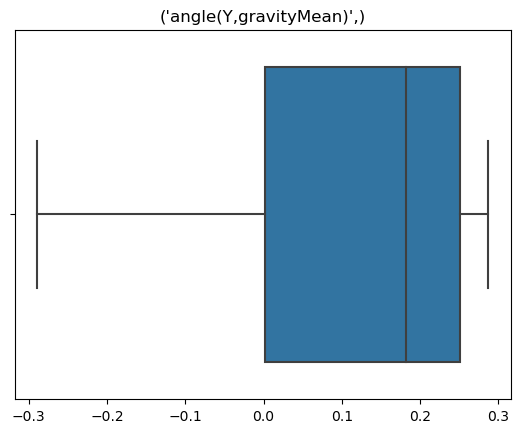

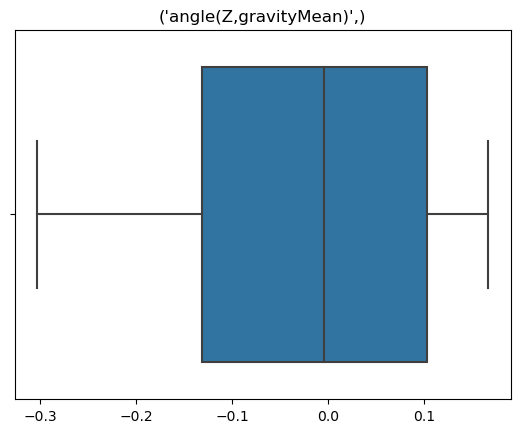

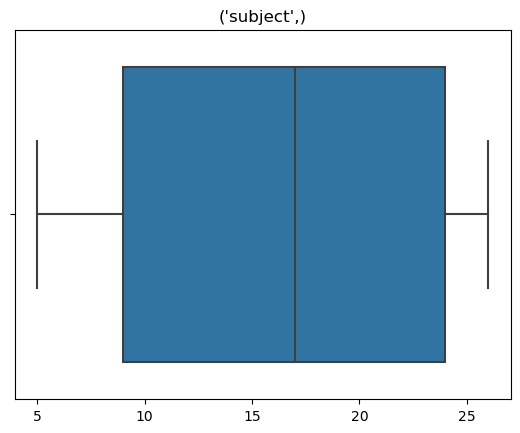

In [21]:

for i in data.columns[:-1]:
    plt.figure()
    sns.boxplot(x = data[i].values)
    plt.title(f'{i}')

plt.show()
    

In [22]:
data.shape

(10299, 563)

In [23]:
# checking missing value 
data.isnull().sum().sum()

0

([<matplotlib.patches.Wedge at 0x2bd72012760>,
 [Text(0.912197696055357, 0.6147319442743304, 'WALKING'),
  Text(-0.21486667196758633, 1.0788106012074472, 'WALKING_UPSTAIRS'),
  Text(-1.065601489034256, 0.2729349126952738, 'WALKING_DOWNSTAIRS'),
  Text(-0.7531828672782088, -0.8016954337144352, 'SITTING'),
  Text(0.2636606321506688, -1.0679340199908935, 'STANDING'),
  Text(1.000373282280183, -0.4574421232243195, 'LAYING')],
 [Text(0.49756237966655836, 0.3353083332405438, '18.88%'),
  Text(-0.1172000028914107, 0.5884421461131529, '18.51%'),
  Text(-0.5812371758368668, 0.1488735887428766, '17.25%'),
  Text(-0.41082701851538656, -0.43728841838969185, '16.72%'),
  Text(0.14381489026400116, -0.5825094654495782, '14.99%'),
  Text(0.5456581539710088, -0.24951388539508332, '13.65%')])

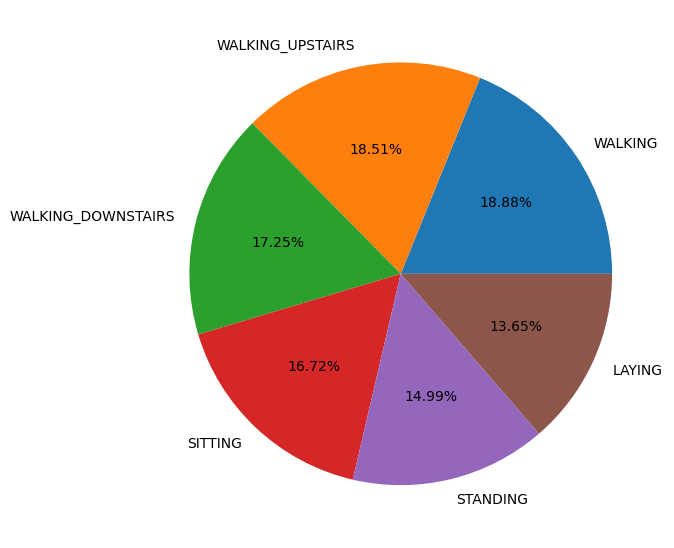

In [24]:
#labels =  (1: WALKING,2: WALKING_UPSTAIRS, 3: WALKING_DOWNSTAIRS, 4: SITTING, 5: STANDING, 6: LAYING)

x = data['Activity'].value_counts()
plt.figure(figsize = (15,10))
plt.subplot(1,2,1)
plt.pie(x, autopct='%.2f%%', labels=['WALKING', 'WALKING_UPSTAIRS', 'WALKING_DOWNSTAIRS', 'SITTING', 'STANDING', 'LAYING'])

<AxesSubplot:ylabel='count'>

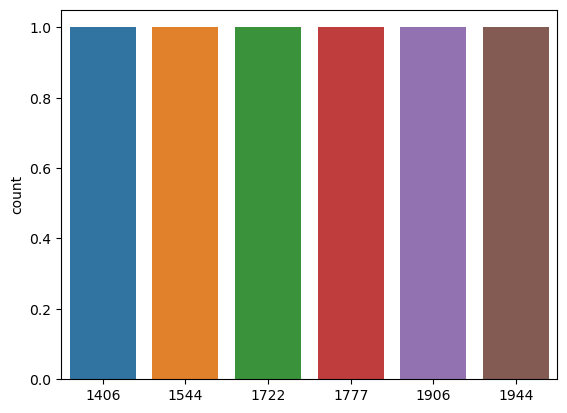

In [25]:
# checking balance and imbalance data using countplot 
sns.countplot(data['Activity'].value_counts())

As we can see in the above graph, our dataset is look like a balance data

In [27]:
print(type(data))

<class 'pandas.core.frame.DataFrame'>


In [28]:
# lets select the independent and dependent variable

x = data.iloc[:,:-1]          # independent 
y = data['Activity']             # dependent

In [29]:
# spliting the data
from sklearn.model_selection import train_test_split# spliting the data

In [30]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=0)

# Models building

### LinearRegression

In [31]:
from sklearn.linear_model import LinearRegression
regression=LinearRegression()

In [32]:
regression.fit(x_train,y_train)

LinearRegression()

In [33]:
test_data=regression.predict(x_test)
test_data

array([[4.28232444],
       [2.74075014],
       [5.98641597],
       ...,
       [3.90112714],
       [1.80756697],
       [2.19802378]])

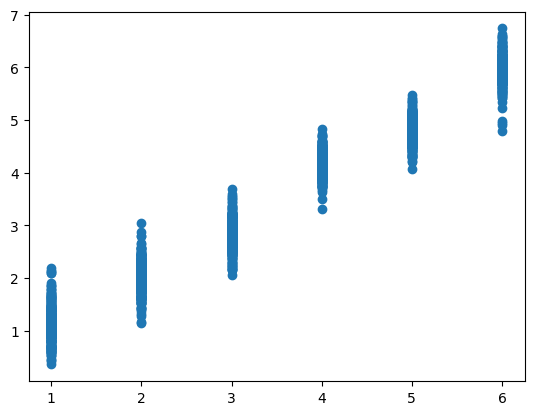

In [34]:
plt.scatter(y_test,test_data)

In [97]:
from sklearn.metrics import r2_score
linear_accuracy = r2_score(y_test,test_data)
linear_accuracy

0.9709896562496

### Preparing  Logistic Regression Model

In [102]:
# Model building 
from sklearn.linear_model import LogisticRegression

In [103]:
lr = LogisticRegression()

In [104]:
lr.fit(x_train, y_train)

LogisticRegression()

In [105]:
pred = lr.predict(x_test)

In [106]:
pred

array([4, 3, 6, ..., 4, 2, 2], dtype=int64)

In [107]:
from sklearn.metrics import accuracy_score

In [108]:
logistic_accuracy = accuracy_score(pred, y_test)

In [109]:
logistic_accuracy

0.9718446601941747

### Preparing KNeighborsClassifier  Model

In [44]:
# KNN
from sklearn.neighbors import KNeighborsClassifier

In [45]:
knn = KNeighborsClassifier()

In [46]:
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [47]:
pred1 = knn.predict(x_test)

In [48]:
pred1

array([4, 3, 6, ..., 4, 2, 2], dtype=int64)

In [49]:
from sklearn.metrics import classification_report, confusion_matrix

In [50]:
confusion_matrix(pred1,y_test)

array([[335,   1,   1,   0,   0,   0],
       [  0, 315,   0,   0,   0,   0],
       [  0,   0, 277,   0,   0,   0],
       [  0,   0,   0, 325,  29,   1],
       [  0,   0,   0,  37, 361,   0],
       [  0,   0,   0,   2,   0, 376]], dtype=int64)

In [51]:
print(classification_report(pred1, y_test))

              precision    recall  f1-score   support

           1       1.00      0.99      1.00       337
           2       1.00      1.00      1.00       315
           3       1.00      1.00      1.00       277
           4       0.89      0.92      0.90       355
           5       0.93      0.91      0.92       398
           6       1.00      0.99      1.00       378

    accuracy                           0.97      2060
   macro avg       0.97      0.97      0.97      2060
weighted avg       0.97      0.97      0.97      2060



In [110]:
knn_accuracy = accuracy_score(pred1, y_test)

In [112]:
knn_accuracy

0.9655339805825243

In [54]:
x_test.shape

(2060, 562)

In [55]:
x_train.shape

(8239, 562)

In [60]:
y_test = y_test.squeeze()

In [61]:
y_train = y_train.squeeze()

In [62]:
# Choosing k-value:

error_rate = []
for i in range(1,40):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train,y_train)
    predict = knn.predict(x_test)
    error = np.mean(predict!=y_test)
    error_rate.append(error)

In [63]:
error_rate

[0.02621359223300971,
 0.03640776699029126,
 0.02912621359223301,
 0.03300970873786408,
 0.03446601941747573,
 0.040776699029126215,
 0.0354368932038835,
 0.038834951456310676,
 0.03737864077669903,
 0.0383495145631068,
 0.04029126213592233,
 0.038834951456310676,
 0.040776699029126215,
 0.0412621359223301,
 0.04223300970873786,
 0.04320388349514563,
 0.04514563106796116,
 0.0441747572815534,
 0.0470873786407767,
 0.04563106796116505,
 0.04611650485436893,
 0.04902912621359223,
 0.04951456310679612,
 0.04902912621359223,
 0.04902912621359223,
 0.050970873786407765,
 0.051941747572815535,
 0.05048543689320388,
 0.05242718446601942,
 0.05048543689320388,
 0.05242718446601942,
 0.052912621359223304,
 0.052912621359223304,
 0.05145631067961165,
 0.053883495145631066,
 0.05048543689320388,
 0.05145631067961165,
 0.05242718446601942,
 0.055825242718446605]

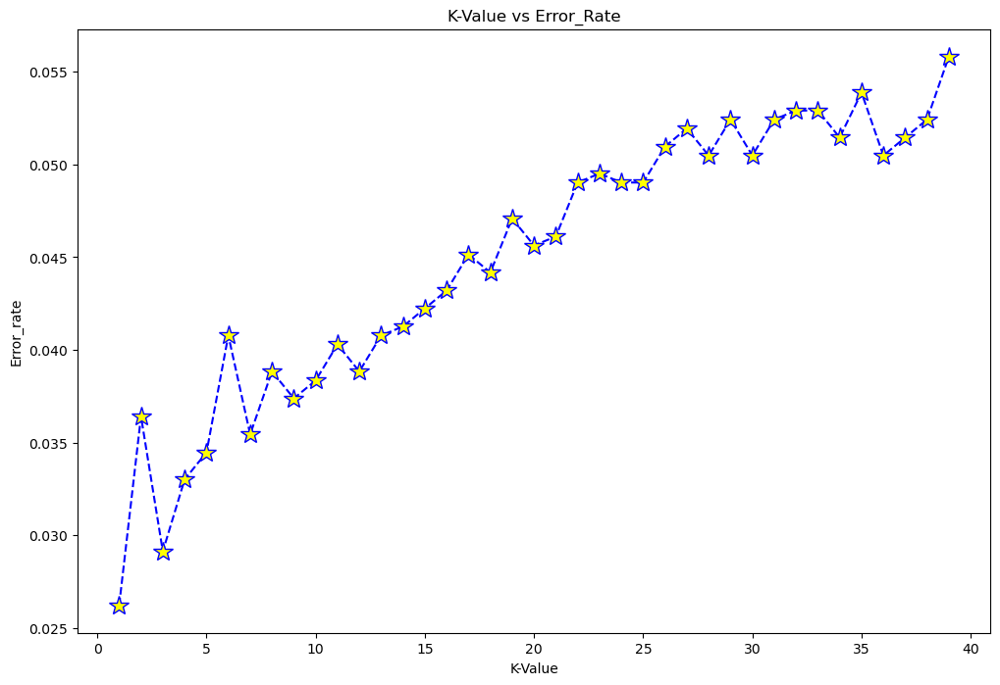

In [65]:
# K-Value vs Error_Rate

plt.figure(figsize = (12,8))
plt.plot(range(1,40), error_rate, linestyle = 'dashed', marker = '*', markersize = 15, markerfacecolor = 'yellow', c = 'b')
plt.title('K-Value vs Error_Rate')
plt.xlabel('K-Value')
plt.ylabel('Error_rate')
plt.show()


In [68]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(x_train,y_train)
pred2 = knn.predict(x_test)
print("With K = 1")
print("Confusion matrix: ",confusion_matrix(pred2,y_test))
print()
print("Classification Report",classification_report(pred2, y_test))

With K = 1
Confusion matrix:  [[334   0   2   0   0   0]
 [  0 316   0   0   0   0]
 [  1   0 276   0   0   0]
 [  0   0   0 334  20   1]
 [  0   0   0  30 370   0]
 [  0   0   0   0   0 376]]

Classification Report               precision    recall  f1-score   support

           1       1.00      0.99      1.00       336
           2       1.00      1.00      1.00       316
           3       0.99      1.00      0.99       277
           4       0.92      0.94      0.93       355
           5       0.95      0.93      0.94       400
           6       1.00      1.00      1.00       376

    accuracy                           0.97      2060
   macro avg       0.98      0.98      0.98      2060
weighted avg       0.97      0.97      0.97      2060



In [71]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train,y_train)
pred2 = knn.predict(x_test)
print("With K = 5")
print("Confusion matrix: ",confusion_matrix(pred2,y_test))
print()
print("Classification Report",classification_report(pred2, y_test))

With K = 5
Confusion matrix:  [[335   1   1   0   0   0]
 [  0 315   0   0   0   0]
 [  0   0 277   0   0   0]
 [  0   0   0 325  29   1]
 [  0   0   0  37 361   0]
 [  0   0   0   2   0 376]]

Classification Report               precision    recall  f1-score   support

           1       1.00      0.99      1.00       337
           2       1.00      1.00      1.00       315
           3       1.00      1.00      1.00       277
           4       0.89      0.92      0.90       355
           5       0.93      0.91      0.92       398
           6       1.00      0.99      1.00       378

    accuracy                           0.97      2060
   macro avg       0.97      0.97      0.97      2060
weighted avg       0.97      0.97      0.97      2060



In [72]:
knn = KNeighborsClassifier(n_neighbors=6)
knn.fit(x_train,y_train)
pred2 = knn.predict(x_test)
print("With K = 6")
print("Confusion matrix:\n\n",confusion_matrix(pred2,y_test))
print()
print("Classification Report:\n\n",classification_report(pred2, y_test))

With K = 6
Confusion matrix:

 [[335   1   4   0   0   0]
 [  0 314   3   0   0   0]
 [  0   1 271   0   0   0]
 [  0   0   0 334  44   1]
 [  0   0   0  29 346   0]
 [  0   0   0   1   0 376]]

Classification Report:

               precision    recall  f1-score   support

           1       1.00      0.99      0.99       340
           2       0.99      0.99      0.99       317
           3       0.97      1.00      0.99       272
           4       0.92      0.88      0.90       379
           5       0.89      0.92      0.90       375
           6       1.00      1.00      1.00       377

    accuracy                           0.96      2060
   macro avg       0.96      0.96      0.96      2060
weighted avg       0.96      0.96      0.96      2060



In [73]:
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(x_train,y_train)
pred2 = knn.predict(x_test)
print("With K = 7")
print("Confusion matrix:\n\n",confusion_matrix(pred2,y_test))
print()
print("Classification Report:\n\n",classification_report(pred2, y_test))

With K = 7
Confusion matrix:

 [[335   0   2   0   0   0]
 [  0 315   2   0   0   0]
 [  0   1 274   0   0   0]
 [  0   0   0 321  24   1]
 [  0   0   0  41 366   0]
 [  0   0   0   2   0 376]]

Classification Report:

               precision    recall  f1-score   support

           1       1.00      0.99      1.00       337
           2       1.00      0.99      1.00       317
           3       0.99      1.00      0.99       275
           4       0.88      0.93      0.90       346
           5       0.94      0.90      0.92       407
           6       1.00      0.99      1.00       378

    accuracy                           0.96      2060
   macro avg       0.97      0.97      0.97      2060
weighted avg       0.97      0.96      0.96      2060



In [74]:
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(x_train,y_train)
pred2 = knn.predict(x_test)
print("With K = 10")
print("Confusion matrix:\n\n",confusion_matrix(pred2,y_test))
print()
print("Classification Report:\n\n",classification_report(pred2, y_test))

With K = 10
Confusion matrix:

 [[335   2   2   0   0   0]
 [  0 314   1   0   0   1]
 [  0   0 275   0   0   0]
 [  0   0   0 325  33   1]
 [  0   0   0  37 357   0]
 [  0   0   0   2   0 375]]

Classification Report:

               precision    recall  f1-score   support

           1       1.00      0.99      0.99       339
           2       0.99      0.99      0.99       316
           3       0.99      1.00      0.99       275
           4       0.89      0.91      0.90       359
           5       0.92      0.91      0.91       394
           6       0.99      0.99      0.99       377

    accuracy                           0.96      2060
   macro avg       0.96      0.96      0.96      2060
weighted avg       0.96      0.96      0.96      2060



In [75]:
knn = KNeighborsClassifier(n_neighbors=11)
knn.fit(x_train,y_train)
pred2 = knn.predict(x_test)
print("With K = 11")
print("Confusion matrix:\n\n ",confusion_matrix(pred2,y_test))
print()
print("Classification Report:\n\n",classification_report(pred2, y_test))

With K = 11
Confusion matrix:

  [[335   2   2   0   0   0]
 [  0 314   1   0   0   1]
 [  0   0 275   0   0   0]
 [  0   0   0 313  25   1]
 [  0   0   0  49 365   0]
 [  0   0   0   2   0 375]]

Classification Report:

               precision    recall  f1-score   support

           1       1.00      0.99      0.99       339
           2       0.99      0.99      0.99       316
           3       0.99      1.00      0.99       275
           4       0.86      0.92      0.89       339
           5       0.94      0.88      0.91       414
           6       0.99      0.99      0.99       377

    accuracy                           0.96      2060
   macro avg       0.96      0.96      0.96      2060
weighted avg       0.96      0.96      0.96      2060



In [76]:
knn = KNeighborsClassifier(n_neighbors=12)
knn.fit(x_train,y_train)
pred2 = knn.predict(x_test)
print("With K = 12")
print("Confusion matrix:\n\n ",confusion_matrix(pred2,y_test))
print()
print("Classification Report:\n\n",classification_report(pred2, y_test))

With K = 12
Confusion matrix:

  [[334   1   2   0   0   0]
 [  1 314   1   0   0   1]
 [  0   1 275   0   0   0]
 [  0   0   0 323  31   1]
 [  0   0   0  39 359   0]
 [  0   0   0   2   0 375]]

Classification Report:

               precision    recall  f1-score   support

           1       1.00      0.99      0.99       337
           2       0.99      0.99      0.99       317
           3       0.99      1.00      0.99       276
           4       0.89      0.91      0.90       355
           5       0.92      0.90      0.91       398
           6       0.99      0.99      0.99       377

    accuracy                           0.96      2060
   macro avg       0.96      0.96      0.96      2060
weighted avg       0.96      0.96      0.96      2060



### GaussianNB Model

In [121]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()

In [122]:
gnb.fit(x_train, y_train)

GaussianNB()

In [123]:
pred = gnb.predict(x_test)
pred

array([4, 3, 6, ..., 4, 2, 2], dtype=int64)

In [124]:
from sklearn.metrics import accuracy_score

In [125]:
Gaussian_accuracy = accuracy_score(pred,y_test)

In [126]:
Gaussian_accuracy

0.7281553398058253

### DecisionTreeClassifier

In [127]:
# Creating a Decision tree model
from sklearn.tree import DecisionTreeClassifier

In [128]:
dtc = DecisionTreeClassifier()

In [129]:
dtc.fit(x_train, y_train)

DecisionTreeClassifier()

In [130]:
pred = dtc.predict(x_test)
pred

array([4, 3, 6, ..., 4, 2, 1], dtype=int64)

In [132]:
DTC_accuracy = accuracy_score(pred, y_test)
DTC_accuracy

0.9339805825242719

### DecisionTreeRegressor

In [133]:
# preparing for model
from sklearn.tree import DecisionTreeRegressor
regressor=DecisionTreeRegressor()

In [134]:
regressor.fit(x_train,y_train)

DecisionTreeRegressor()

In [135]:
pred=regressor.predict(x_test)

In [136]:
# checking accuracy 
from sklearn.metrics import r2_score

In [137]:
DTR_accuracy = r2_score(y_test,pred)
DTR_accuracy

0.9701610479971478

In [139]:
# All models accuracy
print('linear_accuracy: ',linear_accuracy)
print('logistic_accuracy: ',logistic_accuracy)
print('knn_accuracy: ',knn_accuracy)
print('Gaussian_accuracy: ',Gaussian_accuracy)
print('DTC_accuracy: ',DTC_accuracy)
print('DTR_accuracy: ',DTR_accuracy)

linear_accuracy:  0.9709896562496
logistic_accuracy:  0.9718446601941747
knn_accuracy:  0.9655339805825243
Gaussian_accuracy:  0.7281553398058253
DTC_accuracy:  0.9339805825242719
DTR_accuracy:  0.9701610479971478


Here best model prediction is logistic Regression